In [1]:
from PIL import Image, ImageFilter
import numpy as np
import matplotlib.pyplot as plt



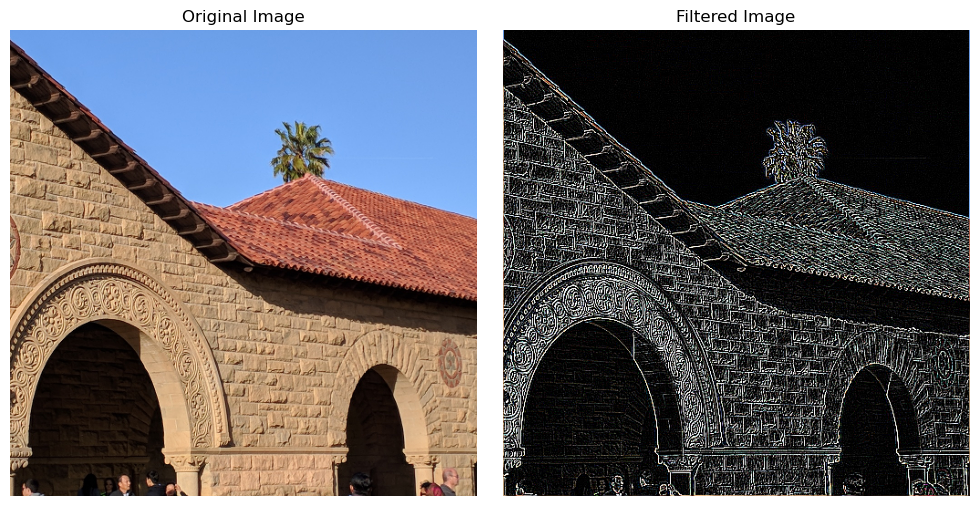

In [2]:
# Load the image
image_path = '4780_input.png'  # Replace with your image path
try:
    image = Image.open(image_path)
except FileNotFoundError:
    raise FileNotFoundError(f"Image not found at {image_path}")



# Convert the image to RGB (if not already in RGB mode)
image_rgb = image.convert("RGB")

# Define a 3x3 filter kernel (e.g., edge detection)
filter_kernel = np.array([[-1, -1, -1],
                          [-1,  8, -1],
                          [-1, -1, -1]])

# Normalize the kernel for PIL (PIL expects normalized kernels)
filter_kernel_normalized = filter_kernel / filter_kernel.sum() if filter_kernel.sum() != 0 else filter_kernel

# Apply the filter using PIL's filter method
filtered_image = image_rgb.filter(ImageFilter.Kernel((3, 3), filter_kernel_normalized.flatten(), scale=1))

# Convert images to arrays for visualization
image_rgb_array = np.array(image_rgb)
filtered_image_array = np.array(filtered_image)

# Visualize the original and filtered images
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image_rgb_array)
plt.title('Original Image')
plt.axis('off')

# Filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image_array)
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

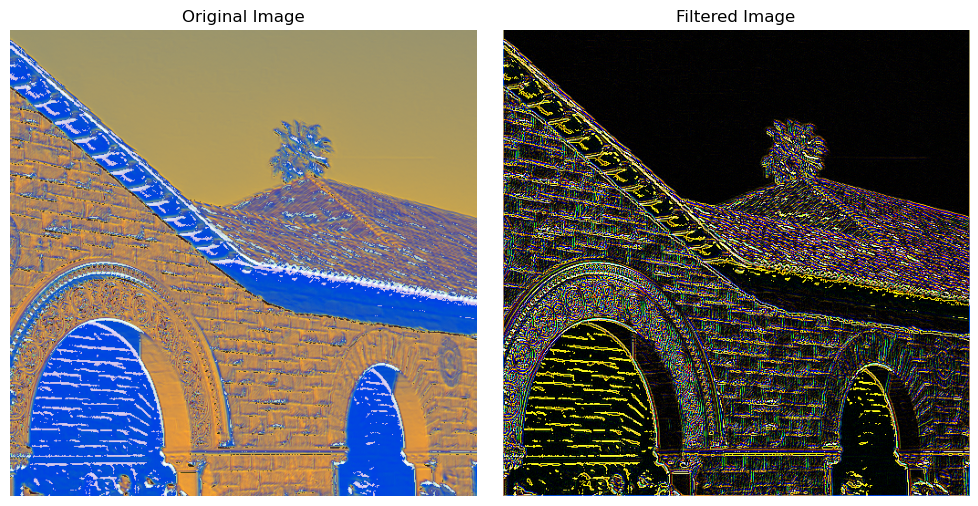

In [3]:
# Load the image
image_path = '4780_target.png'  # Replace with your image path
try:
    image = Image.open(image_path)
except FileNotFoundError:
    raise FileNotFoundError(f"Image not found at {image_path}")



# Convert the image to RGB (if not already in RGB mode)
image_rgb = image.convert("RGB")

# Define a 3x3 filter kernel (e.g., edge detection)
filter_kernel = np.array([[-1, -1, -1],
                          [-1,  8, -1],
                          [-1, -1, -1]])

# Normalize the kernel for PIL (PIL expects normalized kernels)
filter_kernel_normalized = filter_kernel / filter_kernel.sum() if filter_kernel.sum() != 0 else filter_kernel

# Apply the filter using PIL's filter method
filtered_image = image_rgb.filter(ImageFilter.Kernel((3, 3), filter_kernel_normalized.flatten(), scale=1))

# Convert images to arrays for visualization
image_rgb_array = np.array(image_rgb)
filtered_image_array = np.array(filtered_image)

# Visualize the original and filtered images
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image_rgb_array)
plt.title('Original Image')
plt.axis('off')

# Filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image_array)
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

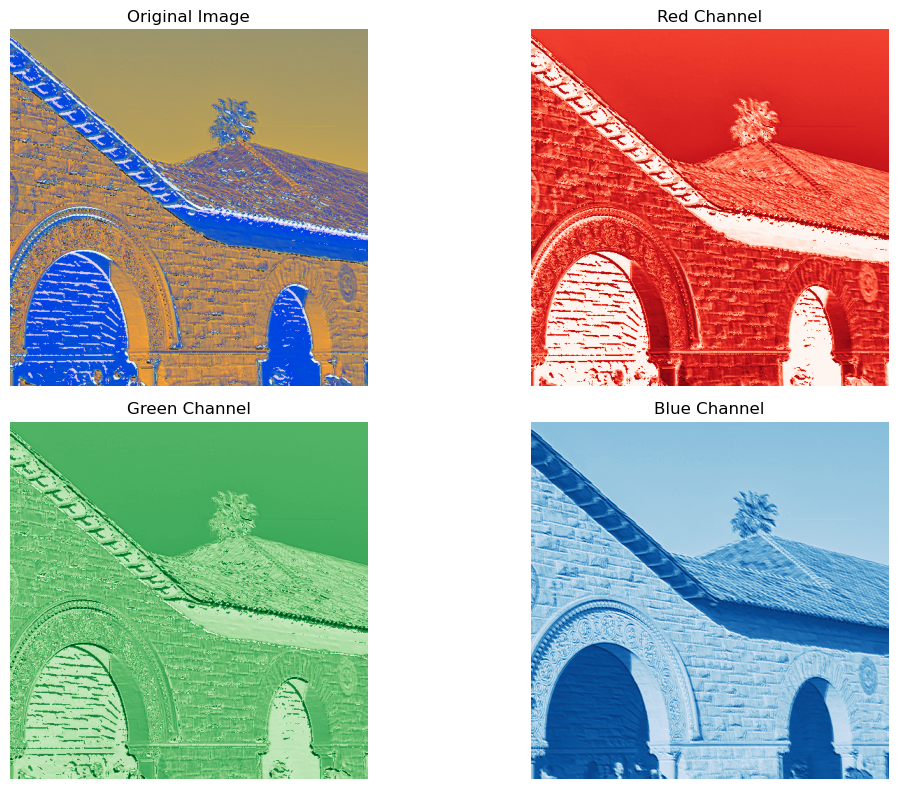

In [4]:
# Load the image
image_path = '4780_target.png'  # Replace with your image path
try:
    image = Image.open(image_path)
except FileNotFoundError:
    raise FileNotFoundError(f"Image not found at {image_path}")

# Convert the image to RGB (if not already in RGB mode)
image_rgb = image.convert("RGB")

# Split the image into R, G, B channels
r, g, b = image_rgb.split()

# Convert the channels to numpy arrays for visualization
r_array = np.array(r)
g_array = np.array(g)
b_array = np.array(b)

# Plot the original image and its three channels
plt.figure(figsize=(12, 8))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Red channel
plt.subplot(2, 2, 2)
plt.imshow(r_array, cmap='Reds')
plt.title('Red Channel')
plt.axis('off')

# Green channel
plt.subplot(2, 2, 3)
plt.imshow(g_array, cmap='Greens')
plt.title('Green Channel')
plt.axis('off')

# Blue channel
plt.subplot(2, 2, 4)
plt.imshow(b_array, cmap='Blues')
plt.title('Blue Channel')
plt.axis('off')

plt.tight_layout()
plt.show()


Computed Kernel:
[[ 0.04107011  0.03765095  0.13450315  0.02680719  0.13967127]
 [ 0.01323645 -0.00817473  0.03640557  0.09910469  0.03314158]
 [ 0.09563898  0.02581976  0.01039514 -0.02641825  0.10116773]
 [ 0.01043225 -0.01402196  0.06286859 -0.00602844  0.02481551]
 [ 0.0635544   0.00895209  0.05464369 -0.05081076  0.03125225]]


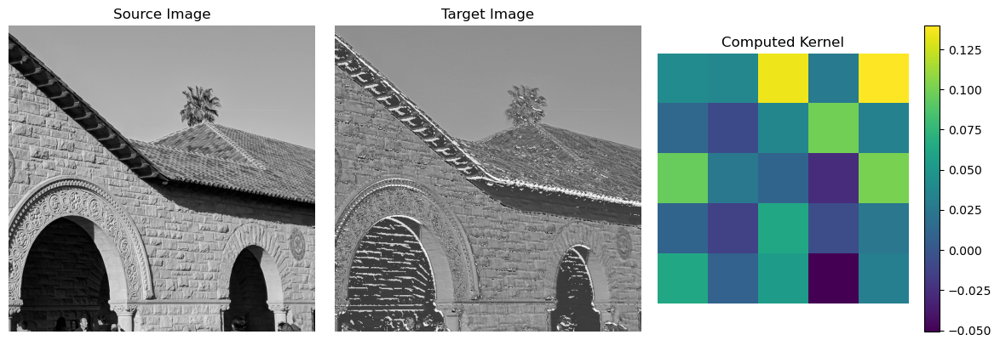

In [5]:
from scipy.linalg import lstsq

# Load the source and target images
source_image_path = '4780_input.png'  # Replace with your source image path
target_image_path = '4780_target.png'  # Replace with your target image path

try:
    source_image = Image.open(source_image_path).convert("L")  # Convert to grayscale
    target_image = Image.open(target_image_path).convert("L")  # Convert to grayscale
except FileNotFoundError as e:
    raise FileNotFoundError(str(e))

# Convert images to numpy arrays
source_array = np.array(source_image, dtype=np.float64)
target_array = np.array(target_image, dtype=np.float64)

# Ensure the images have the same dimensions
if source_array.shape != target_array.shape:
    raise ValueError("Source and target images must have the same dimensions")

# Kernel size (e.g., 3x3)
kernel_size = 5
pad = kernel_size // 2

# Pad the source image to handle edges
padded_source = np.pad(source_array, pad, mode='constant', constant_values=0)

# Prepare the A matrix (neighborhoods) and b vector (target intensities)
h, w = source_array.shape
A = []
b = []

for i in range(h):
    for j in range(w):
        # Extract the neighborhood
        neighborhood = padded_source[i:i + kernel_size, j:j + kernel_size].flatten()
        A.append(neighborhood)
        b.append(target_array[i, j])

A = np.array(A)
b = np.array(b)

# Solve for the kernel using least squares
k, _, _, _ = lstsq(A, b)
kernel = k.reshape((kernel_size, kernel_size))

# Display the resulting kernel
print("Computed Kernel:")
print(kernel)

# Visualize the source, target, and kernel
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(source_array, cmap='gray')
plt.title('Source Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(target_array, cmap='gray')
plt.title('Target Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(kernel, cmap='viridis')
plt.title('Computed Kernel')
plt.colorbar()
plt.axis('off')

plt.tight_layout()
plt.show()

# Normalize the kernel for PIL (PIL expects normalized kernels)
filter_kernel_normalized = kernel / kernel.sum() if kernel.sum() != 0 else kernel





In [6]:
# Define a function to apply a kernel to a 2D array using PIL
def apply_kernel_with_pil(array, kernel):
    # Convert the array to a PIL image
    image = Image.fromarray(array.astype(np.float32))
    image = image.convert("L")

    # Flatten the kernel and normalize it for PIL
    kernel_size = kernel.shape[0]
    kernel_flattened = kernel.flatten()
    kernel_normalized = kernel_flattened / kernel_flattened.sum() if kernel_flattened.sum() != 0 else kernel_flattened

    # Apply the kernel using ImageFilter.Kernel
    filtered_image = image.filter(ImageFilter.Kernel((kernel_size, kernel_size), kernel_normalized, scale=1))

    # Convert the filtered image back to a numpy array
    return np.array(filtered_image)



# Apply the kernel to the array
filtered_array = apply_kernel_with_pil(source_array, filter_kernel_normalized)

(-0.5, 511.5, 511.5, -0.5)

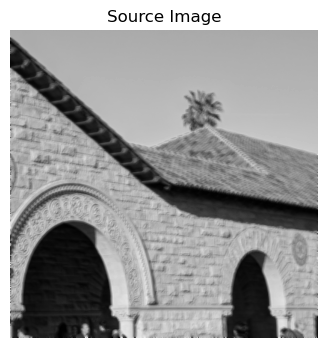

In [7]:
# Visualize the source, target, and kernel
plt.figure(figsize=(12, 4))

plt.imshow(filtered_array, cmap='gray')
plt.title('Source Image')
plt.axis('off')

In [8]:
np.linalg.norm(target_array - source_array)

27895.29933519266

In [9]:
np.linalg.norm(target_array - filtered_array)

25586.493819982446

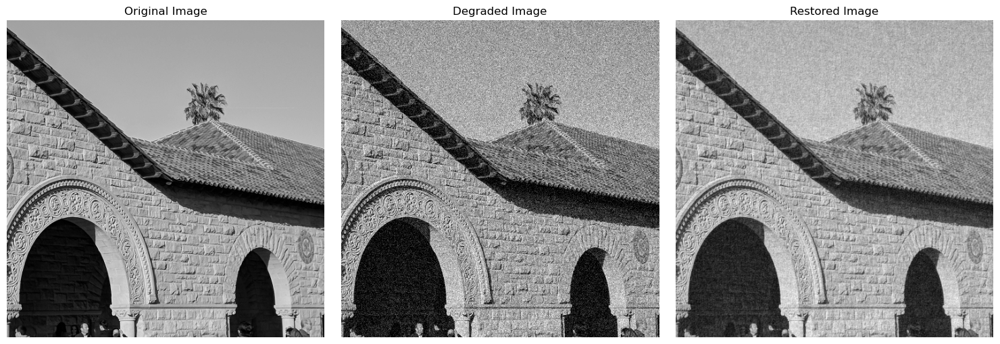

In [10]:
import numpy as np
from skimage import io, img_as_float
from skimage.color import rgb2gray
from skimage.util import random_noise
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2, fftshift, ifftshift

# Function to compute the Wiener filter
def wiener_filter(source, target):
    # Perform Fourier transforms of source and target images
    F_s = fft2(source)
    F_t = fft2(target)
    
    # Estimate power spectral densities
    P_S = np.abs(F_t) ** 2
    P_N = np.abs(F_s - F_t) ** 2

    # Compute the Wiener filter
    H = P_S / (P_S + P_N)

    # Apply the Wiener filter
    F_restored = H * F_s

    # Perform inverse Fourier transform to get the restored image
    restored_image = np.real(ifft2(F_restored))
    return restored_image

# Load source (degraded) and target (original) images
# Use any two images; here we simulate a degraded version
original_image = rgb2gray(img_as_float(io.imread('4780_input.png')))
degraded_image = random_noise(original_image, var=0.01)  # Add Gaussian noise

# Apply Wiener filter
restored_image = wiener_filter(degraded_image, original_image)

# Plot results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(original_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Degraded Image")
plt.imshow(degraded_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Restored Image")
plt.imshow(restored_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

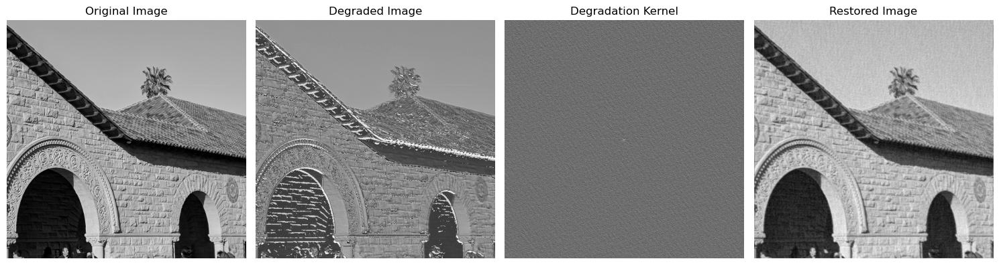

In [11]:
import numpy as np
from skimage import io, img_as_float, color
from skimage.restoration import unsupervised_wiener
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2, fftshift

# Load the input (degraded) and target (original) images
degraded_image = img_as_float(io.imread("4780_target.png"))
original_image = img_as_float(io.imread("4780_input.png"))

# Convert to grayscale if necessary
if len(degraded_image.shape) == 3:
    degraded_image = color.rgb2gray(degraded_image)
if len(original_image.shape) == 3:
    original_image = color.rgb2gray(original_image)

# Compute Fourier transforms of both images
F_s = fft2(degraded_image)
F_t = fft2(original_image)

# Estimate the degradation kernel in the frequency domain
H_d = F_s / F_t

# Shift and inverse FFT to get the kernel in the spatial domain
degradation_kernel = np.real(ifft2(H_d))
degradation_kernel = fftshift(degradation_kernel)  # Shift the kernel for visualization

# Apply unsupervised Wiener filter
restored_image, _ = unsupervised_wiener(degraded_image, degradation_kernel)

# Plot results
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(original_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("Degraded Image")
plt.imshow(degraded_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("Degradation Kernel")
plt.imshow(degradation_kernel, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Restored Image")
plt.imshow(restored_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


In [16]:
import numpy as np

def calculate_mse(image1, image2):
    """
    Calculate the Mean Squared Error (MSE) between two images.
    
    Args:
        image1 (ndarray): First image (can be grayscale or RGB).
        image2 (ndarray): Second image (same size as the first image).
    
    Returns:
        float: MSE value.
    """
    # Ensure the images have the same shape
    assert image1.shape == image2.shape, "Images must have the same dimensions"
    
    # Compute MSE
    mse = np.mean((image1 - image2) ** 2)
    return mse



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0882974019177688..1.0].


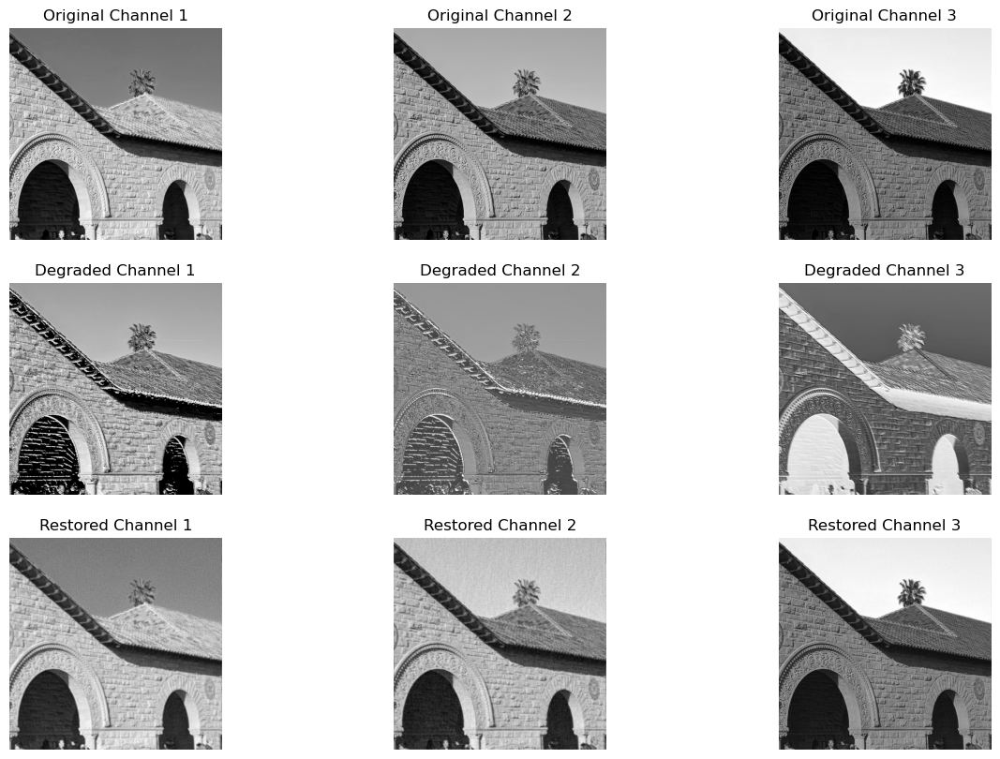

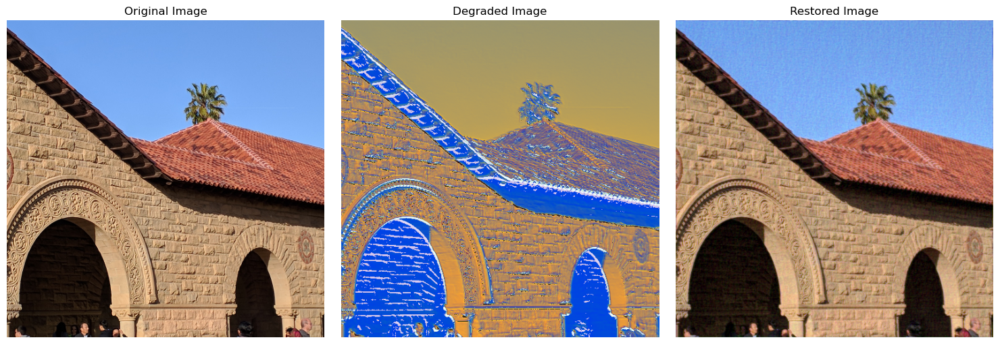

In [29]:
import numpy as np
from skimage import io, img_as_float, restoration
from skimage.restoration import unsupervised_wiener, denoise_nl_means, estimate_sigma
from skimage.util import img_as_ubyte
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2, fftshift

# Load the input (degraded) and target (original) images
degraded_image = img_as_float(io.imread("4780_target.png"))
original_image = img_as_float(io.imread("4780_input.png"))

# Ensure both images have the same dimensions
assert degraded_image.shape == original_image.shape, "Input and degraded images must have the same dimensions."

# Initialize arrays for storing restored channels
restored_channels = []

# Process each channel independently
for channel in range(degraded_image.shape[2]):  # Loop through RGB channels
    # Extract the specific channel
    degraded_channel = degraded_image[:, :, channel]
    original_channel = original_image[:, :, channel]

    # Compute Fourier transforms of both images
    F_s = fft2(degraded_channel)
    F_t = fft2(original_channel)

    # Estimate the degradation kernel in the frequency domain
    H_d = F_s / (F_t + 1e-8)  # Add small value to prevent division by zero

    # Shift and inverse FFT to get the kernel in the spatial domain
    degradation_kernel = np.real(ifft2(H_d))
    degradation_kernel = fftshift(degradation_kernel)  # Shift the kernel for visualization

    # Apply unsupervised Wiener filter
    restored_channel, _ = unsupervised_wiener(degraded_channel, degradation_kernel)

    # Append the restored channel
    restored_channels.append(restored_channel)

# Combine restored channels into a color image
restored_image = np.stack(restored_channels, axis=-1)

# Plot results
plt.figure(figsize=(15, 10))

# Plot each channel separately
for i, (original, degraded, restored) in enumerate(zip(
    np.rollaxis(original_image, 2), 
    np.rollaxis(degraded_image, 2), 
    restored_channels
), 1):
    plt.subplot(3, 3, i)
    plt.title(f"Original Channel {i}")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 3, i + 3)
    plt.title(f"Degraded Channel {i}")
    plt.imshow(degraded, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 3, i + 6)
    plt.title(f"Restored Channel {i}")
    plt.imshow(restored, cmap='gray')
    plt.axis('off')

# Plot final comparison
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(original_image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Degraded Image")
plt.imshow(degraded_image)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Restored Image")
plt.imshow(restored_image)
plt.axis('off')

plt.tight_layout()
plt.show()


In [31]:
degradation_kernel.shape

(512, 512)

In [20]:
# Example usage:
mse_value = calculate_mse(original_image, degraded_image)
print(f"original_image Mean Squared Error (MSE): {mse_value}")

# Example usage:
mse_value = calculate_mse(original_image, restored_image)
print(f"After filtering Mean Squared Error (MSE): {mse_value}")

original_image Mean Squared Error (MSE): 0.12298600232648522
After filtering Mean Squared Error (MSE): 0.0025181923216116577


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07934062782104634..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07934062782104634..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07693968114754313..1.0].


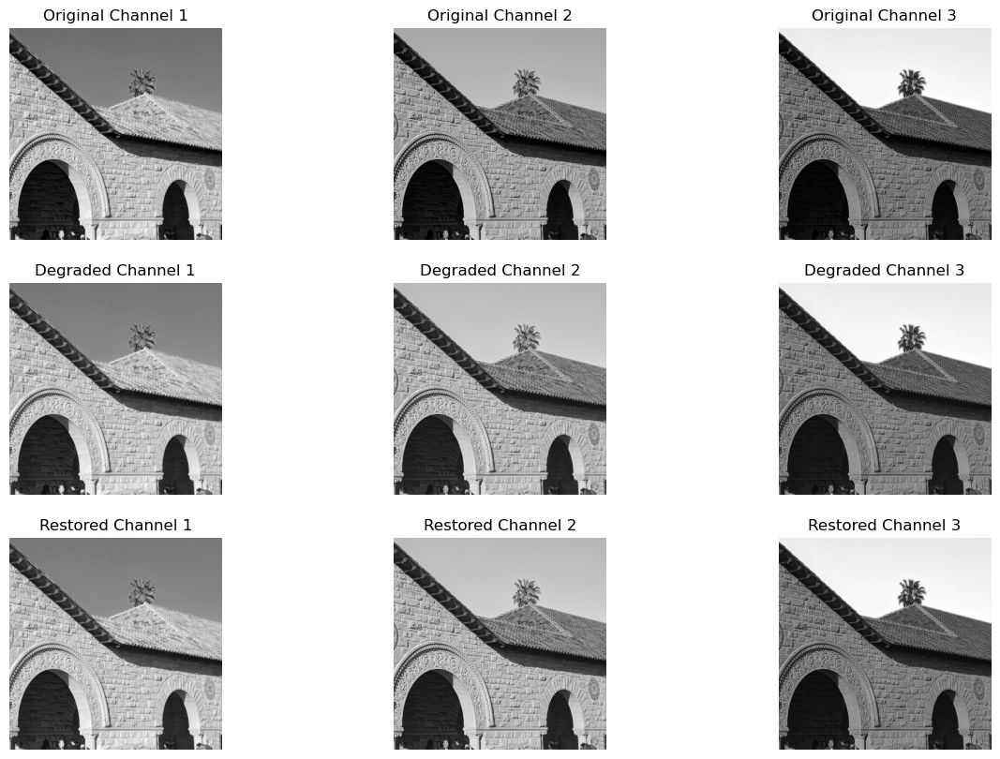

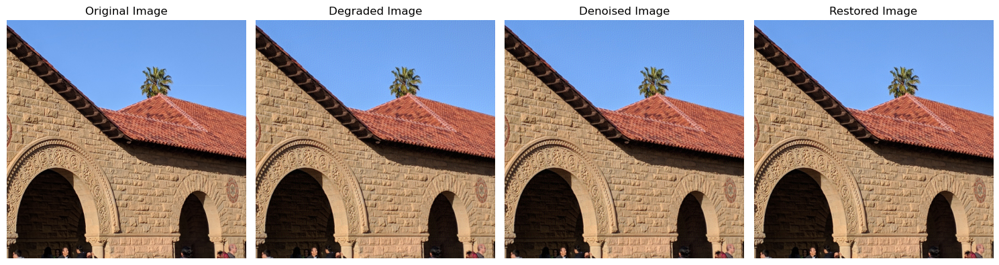

In [22]:
def denoise_image(image, patch_size=7, patch_distance=11, h=0.1):
    """
    Apply Non-Local Means (NLM) denoising to the input image.
    
    Args:
        image (ndarray): Input image (2D or 3D).
        patch_size (int): Size of the patches used for denoising.
        patch_distance (int): Max distance to search for similar patches.
        h (float): Filtering parameter (higher h means more denoising).
        
    Returns:
        ndarray: Denoised image.
    """
    sigma_est = np.mean(estimate_sigma(image, channel_axis=0))  # Estimate noise
    denoised = denoise_nl_means(
        image,
        h=h * sigma_est,
        patch_size=patch_size,
        patch_distance=patch_distance,
        channel_axis=0,
        fast_mode=True,
    )
    return denoised

# Load the input (degraded) and target (original) images
degraded_image = restored_image#img_as_float(io.imread("4780_target.png"))
original_image = original_image#img_as_float(io.imread("4780_input.png"))

# Ensure both images have the same dimensions
assert degraded_image.shape == original_image.shape, "Input and degraded images must have the same dimensions."

# Denoise the degraded image
denoised_image = denoise_image(degraded_image)

# Initialize arrays for storing restored channels
restored_channels = []

# Process each channel independently
for channel in range(degraded_image.shape[2]):  # Loop through RGB channels
    # Extract the specific channel
    degraded_channel = denoised_image[:, :, channel]
    original_channel = original_image[:, :, channel]

    # Compute Fourier transforms of both images
    F_s = fft2(degraded_channel)
    F_t = fft2(original_channel)

    # Estimate the degradation kernel in the frequency domain
    H_d = F_s / (F_t + 1e-8)  # Add small value to prevent division by zero

    # Shift and inverse FFT to get the kernel in the spatial domain
    degradation_kernel = np.real(ifft2(H_d))
    degradation_kernel = fftshift(degradation_kernel)

    # Apply unsupervised Wiener filter
    restored_channel, _ = unsupervised_wiener(degraded_channel, degradation_kernel)

    # Append the restored channel
    restored_channels.append(restored_channel)

# Combine restored channels into a color image
restored_image = np.stack(restored_channels, axis=-1)

# Plot results
plt.figure(figsize=(15, 10))

# Plot each channel separately
for i, (original, degraded, restored) in enumerate(zip(
    np.rollaxis(original_image, 2), 
    np.rollaxis(degraded_image, 2), 
    restored_channels
), 1):
    plt.subplot(3, 3, i)
    plt.title(f"Original Channel {i}")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 3, i + 3)
    plt.title(f"Degraded Channel {i}")
    plt.imshow(degraded, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 3, i + 6)
    plt.title(f"Restored Channel {i}")
    plt.imshow(restored, cmap='gray')
    plt.axis('off')

# Plot final comparison
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(original_image)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("Degraded Image")
plt.imshow(degraded_image)
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("Denoised Image")
plt.imshow(denoised_image)
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Restored Image")
plt.imshow(restored_image)
plt.axis('off')

plt.tight_layout()
plt.show()

In [23]:
# Example usage:
mse_value = calculate_mse(original_image, degraded_image)
print(f"original_image Mean Squared Error (MSE): {mse_value}")

# Example usage:
mse_value = calculate_mse(original_image, denoised_image)
print(f"denoised Mean Squared Error (MSE): {mse_value}")

# Example usage:
mse_value = calculate_mse(original_image, restored_image)
print(f"Final Mean Squared Error (MSE): {mse_value}")

original_image Mean Squared Error (MSE): 0.0011375855150882357
denoised Mean Squared Error (MSE): 0.0011375855150882357
Final Mean Squared Error (MSE): 0.0006999406133533022


In [28]:
np.linalg.norm(restored_image - original_image)

23.46179226829581

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12510.826892351408..12510.753321083846].


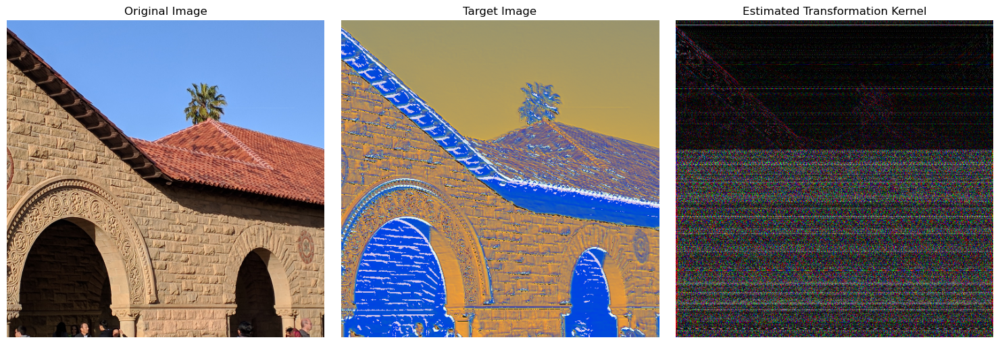

In [49]:
import numpy as np
from skimage import io, img_as_float
from numpy.fft import fft2, ifft2, fftshift
import matplotlib.pyplot as plt

def calculate_kernel(original_image, target_image):
    """
    Calculate the kernel that transforms the original image to the target image in the frequency domain.
    
    Args:
        original_image (ndarray): The original (untransformed) image.
        target_image (ndarray): The target (degraded or transformed) image.
    
    Returns:
        ndarray: The estimated transformation kernel in the spatial domain.
    """
    # Compute Fourier transforms of both images
    F_o = fft2(original_image)  # Fourier transform of the original image
    F_t = fft2(target_image)    # Fourier transform of the target image
    
    # Avoid division by zero by adding a small constant
    H = F_t / (F_o + 1e-8)
    
    # Convert the kernel back to the spatial domain
    kernel = np.real(ifft2(H))
    #kernel = fftshift(kernel)  # Shift the kernel for visualization
    return kernel

# Load the original and target images
original_image = img_as_float(io.imread("4780_input.png"))
target_image = img_as_float(io.imread("4780_target.png"))

# Ensure both images have the same shape
assert original_image.shape == target_image.shape, "Original and target images must have the same dimensions."

# Calculate the kernel that transforms the original to the target
transformation_kernel = calculate_kernel(original_image, target_image)

# Plot the results
plt.figure(figsize=(15, 5))

# Plot the original, target, and transformation kernel
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(original_image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Target Image")
plt.imshow(target_image)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Estimated Transformation Kernel")
plt.imshow(transformation_kernel, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.464769391507531e-08..1.0000000410640095].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12510.826892351408..12510.753321083846].


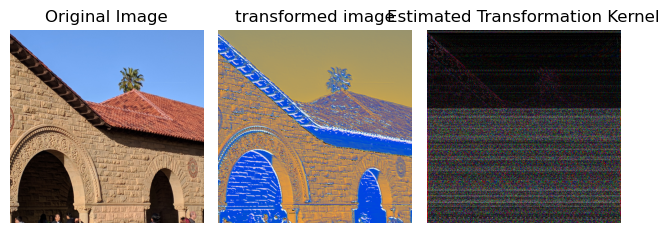

In [50]:
def apply_transformation(original_image, kernel):
    """
    Apply the transformation using the calculated kernel in the frequency domain.
    
    Args:
        original_image (ndarray): The original image.
        kernel (ndarray): The transformation kernel.
    
    Returns:
        ndarray: The transformed image.
    """
    
    # Compute Fourier transform of the original image
    F_o = fft2(original_image)
    
    # Apply the transformation in the frequency domain
    F_transformed = F_o * fft2(kernel)
    
    # Inverse Fourier transform to get the transformed image
    transformed_image = np.real(ifft2(F_transformed))
    return transformed_image


# Apply the transformation to the original image
transformed_image = apply_transformation(original_image, transformation_kernel)
# Plot the original, target, and transformation kernel
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(original_image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("transformed image")
plt.imshow(transformed_image)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Estimated Transformation Kernel")
plt.imshow(transformation_kernel, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

In [52]:
calculate_mse(target_image, transformed_image)

0.0